In [1]:
# create image path, if the path already exists, skip
from pathlib import Path

# image_path = Path(__file__).resolve().parent() / "images"
image_path = Path("/content/drive/MyDrive/AI6121_Assignment1/images") # adjustable
if image_path.is_dir():
  print("Image path already exists.")
else:
  print("Creating image path...")
  image_path.mkdir(parents=True, exist_ok=True)
  print("Image path created")

Creating image path...
Image path created


In [8]:
# unzip image files to image path
import zipfile

# with zipfile.ZipFile(Path(__file__).resolve().parent() / "sample images.zip", "r") as z:
with zipfile.ZipFile("sample images.zip", "r") as z:
  print("Unzipping images")
  z.extractall(image_path)
  print("Images unzipped")

Unzipping images
Images unzipped


In [3]:
import os
#change dir
os.chdir('/content/drive/MyDrive/AI6121_Assignment1')

Random image path: images/sample07.jpg


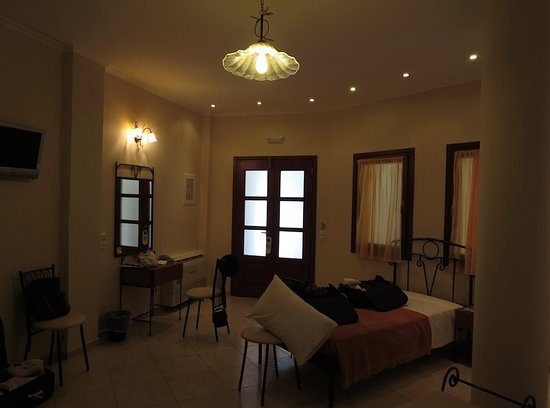

In [12]:
# visualize a random image within the image folder
import random
from PIL import Image

def see_random_image(image_path_str: str):
  image_path = Path(image_path_str)
  if image_path.is_dir():
    image_path_list = list(image_path.glob("*"))
    random_image_path = random.choice(image_path_list)
    print(f"Random image path: {random_image_path}")
    random_image = Image.open(random_image_path)
    return random_image
  else:
    print("Image path does not exist.")

# see_random_image(Path(__file__).resolve().parent() / "images")
see_random_image("images")

In [13]:
# turn images into torch tensors
from torchvision import transforms
from PIL import Image
def image_to_tensor(image_path_str: str):
  image_path = Path(image_path_str)
  if image_path.exists:
    image = Image.open(image_path)
    transform = transforms.ToTensor()
    tensor = transform(image)
    return tensor
  else:
    print("Image path does not exist.")
    return None

# image_tensor = image_to_tensor(Path(__file__).resolve().parent() / "images" / "sample01.jpg")
image_tensor = image_to_tensor("images/sample01.jpg")
image_tensor.shape
# so it's a colour-channel-first tensor

torch.Size([3, 480, 640])

tensor([[0.8118, 0.8039, 0.7922,  ..., 1.0000, 1.0000, 1.0000],
        [0.8392, 0.8275, 0.8157,  ..., 1.0000, 1.0000, 1.0000],
        [0.8392, 0.8314, 0.8275,  ..., 0.9961, 0.9961, 0.9961],
        ...,
        [0.3961, 0.4392, 0.4902,  ..., 0.9529, 0.9529, 0.9529],
        [0.3608, 0.4314, 0.4353,  ..., 0.9451, 0.9529, 0.9686],
        [0.3608, 0.4157, 0.4118,  ..., 0.9451, 0.9529, 0.9686]])

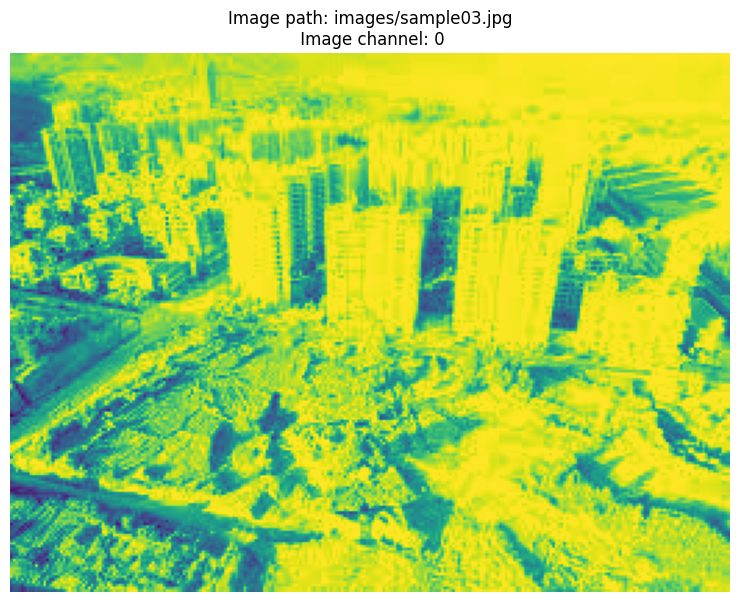

In [15]:
# select a single colour channel and visualize the image
from matplotlib import pyplot as plt

def see_image_channel(image_path_str: str, channel_number: int=0):
  image_tensor = image_to_tensor(image_path_str)
  if image_tensor is None:
    return None
  else:
    if channel_number not in [0, 1, 2]:
      print("Channel number must be 0, 1 or 2.")
      return None
    else:
      image_channel = image_tensor[channel_number]
      plt.figure(figsize=(10, 7))
      plt.imshow(image_channel)
      plt.title(f"Image path: {image_path_str}\n Image channel: {channel_number}")
      plt.axis("off")
      return image_channel

# see_image_channel(Path(__file__) / "images" / "sample03.jpeg", channel_number=0)
see_image_channel("images/sample03.jpg", channel_number=0)

In [ ]:
! cd /content/drive/MyDrive/AI6121_Assignment1;git add .; git commit -m "Update scripts"; git push origin main

[main 11e38ac] Update scripts
 8 files changed, 0 insertions(+), 0 deletions(-)
 create mode 100644 images/sample01.jpg
 create mode 100644 images/sample02.jpeg
 create mode 100644 images/sample03.jpeg
 create mode 100644 images/sample04.jpeg
 create mode 100644 images/sample05.jpeg
 create mode 100644 images/sample06.jpg
 create mode 100644 images/sample07.jpg
 create mode 100644 images/sample08.jpg
Enumerating objects: 12, done.
Counting objects: 100% (12/12), done.
Delta compression using up to 2 threads
Compressing objects: 100% (11/11), done.
Writing objects: 100% (11/11), 292.11 KiB | 5.41 MiB/s, done.
Total 11 (delta 1), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (1/1), completed with 1 local object.
To https://github.com/XiangKeYiNTU/AI6121_Assignment1.git
   7333613..11e38ac  main -> main


In [16]:
import numpy as np
def calculate_psnr(img1, img2):
    """compute the PSNR of img1 and img2 """
    assert img1.shape == img2.shape, "Input images should have equal sizes"
    # Compute MSE (Mean Squared Error)

    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')

    # compute PSNR
    max_pixel_value = 255.0
    psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))
    return mse,psnr

In [19]:
# YUV demo
import numpy as np
from PIL import Image

def rgb_to_yuv(image):
    image = np.array(image, dtype=np.float32)
    # Transform Matrix
    transform_matrix = np.array([[0.299, 0.587, 0.114],
                                 [-0.14713, -0.28886, 0.436],
                                 [0.615, -0.51499, -0.10001]])

    yuv_image = image.dot(transform_matrix.T)
    yuv_image[..., 1:] += 128.0

    return yuv_image.clip(0, 255).astype(np.uint8)

def yuv_to_rgb(yuv_image):
    yuv_image = np.array(yuv_image, dtype=np.float32)

    # Transform Matrix
    transform_matrix = np.array([[1.0, 0.0, 1.13983],
                                 [1.0, -0.39465, -0.58060],
                                 [1.0, 2.03211, 0.0]])

    yuv_image[..., 1:] -= 128.0

    rgb_image = yuv_image.dot(transform_matrix.T)

    return np.clip(rgb_image, 0, 255).astype(np.uint8)

for i in range(1,9):
  image_path = f"images/sample0{i}.jpg"
  image = Image.open(image_path).convert('RGB')
  yuv_image = rgb_to_yuv(image)
  np.save(f'sample0{i}_yuv.npy', yuv_image)

# image_path = 'images/sample01.jpg'
# image = Image.open(image_path).convert('RGB')


# yuv_image = rgb_to_yuv(image)
# np.save('sample01_yuv.npy', yuv_image)

restored_rgb_image = yuv_to_rgb(yuv_image)

restored_image = Image.fromarray(restored_rgb_image)

restored_image.show()


In [20]:
import numpy as np
import cv2
import os

def histogram_equalization(channel, num_bins=256):
    """Apply histogram equalization to a single channel."""
    flat_channel = channel.flatten()
    hist, bins = np.histogram(flat_channel, num_bins, density=False)
    cdf = hist.cumsum()
    cdf_normalized = (num_bins - 1) * cdf / cdf[-1]
    image_equalized = np.interp(flat_channel, bins[:-1], cdf_normalized)
    return image_equalized.reshape(channel.shape).astype(np.uint8)

def calculate_psnr(img1, img2):
    """Compute PSNR between two images."""
    assert img1.shape == img2.shape, "Images must have the same dimensions"
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return mse, psnr

def run_hist_show(image_path):
    # Load image
    image = cv2.imread(image_path)

    # Convert to YCbCr
    ycbcr_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    Y = ycbcr_image[:, :, 0]

    # Apply HE to Y channel
    Y_eq = histogram_equalization(Y)

    # Replace Y channel in the original YCbCr image with the equalized Y
    ycbcr_image_eq = ycbcr_image.copy()
    ycbcr_image_eq[:, :, 0] = Y_eq

    # Convert back to RGB
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    rgb_image_eq = cv2.cvtColor(ycbcr_image_eq, cv2.COLOR_YCrCb2RGB)

    return rgb_image, rgb_image_eq

# Main processing loop
for i in range(1, 9):
    mse_he = []
    psnr_he = []
    for j in range(1, 5):
        image_path = f"images/sample0{i}.jpg"
        img, img_new = run_hist_show(image_path)
        mse_he_i, psnr_he_i = calculate_psnr(img, img_new)
        mse_he.append(mse_he_i)
        psnr_he.append(psnr_he_i)
    print(f"sample0{i}.jpg MSE:", np.mean(mse_he))
    print(f"sample0{i}.jpg PSNR:", np.mean(psnr_he))


sample01.jpg MSE: 65.60783962673611
sample01.jpg PSNR: 29.96124623577531
sample02.jpg MSE: 113.23404848147116
sample02.jpg PSNR: 27.591033258511107
sample03.jpg MSE: 66.45322347384203
sample03.jpg PSNR: 29.905643085771516
sample04.jpg MSE: 105.67423745653254
sample04.jpg PSNR: 27.891112382170075
sample05.jpg MSE: 86.05939169139467
sample05.jpg PSNR: 28.78282088909943
sample06.jpg MSE: 96.15373299223958
sample06.jpg PSNR: 28.30114211279789
sample07.jpg MSE: 108.54602346999405
sample07.jpg PSNR: 27.774664429500827
sample08.jpg MSE: 86.14904383642248
sample08.jpg PSNR: 28.77829899268076


sample01.jpg mse: nan
sample01.jpg psnr: nan
sample02.jpg mse: nan
sample02.jpg psnr: nan
sample03.jpg mse: nan
sample03.jpg psnr: nan
sample04.jpg mse: nan
sample04.jpg psnr: nan
sample05.jpg mse: nan
sample05.jpg psnr: nan
sample06.jpg mse: nan
sample06.jpg psnr: nan
sample07.jpg mse: nan
sample07.jpg psnr: nan
sample08.jpg mse: nan
sample08.jpg psnr: nan


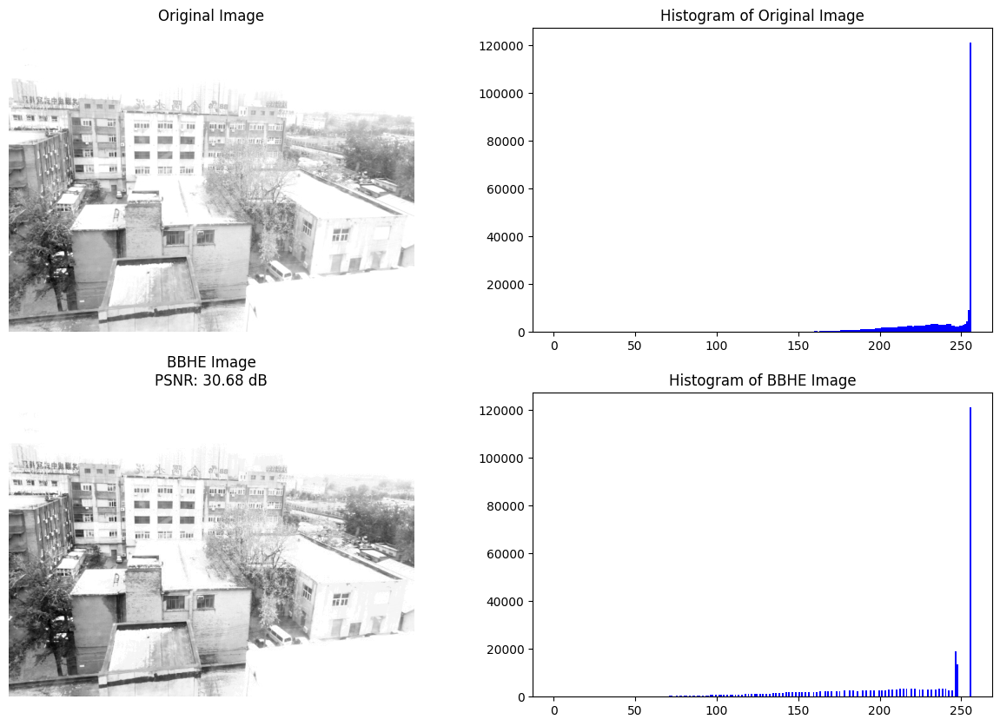

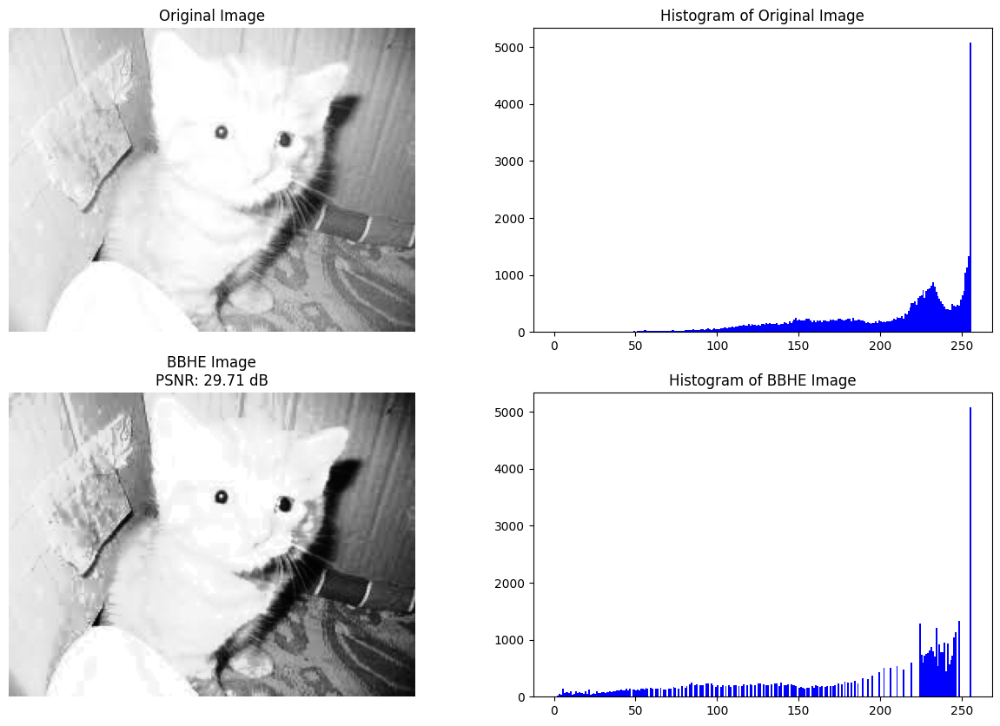

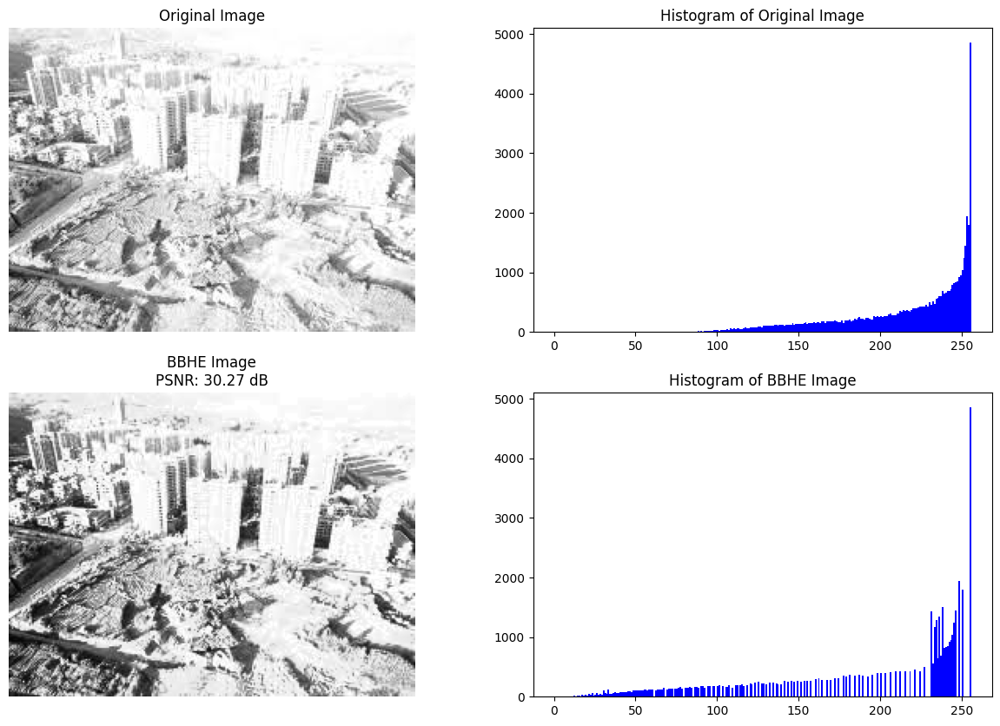

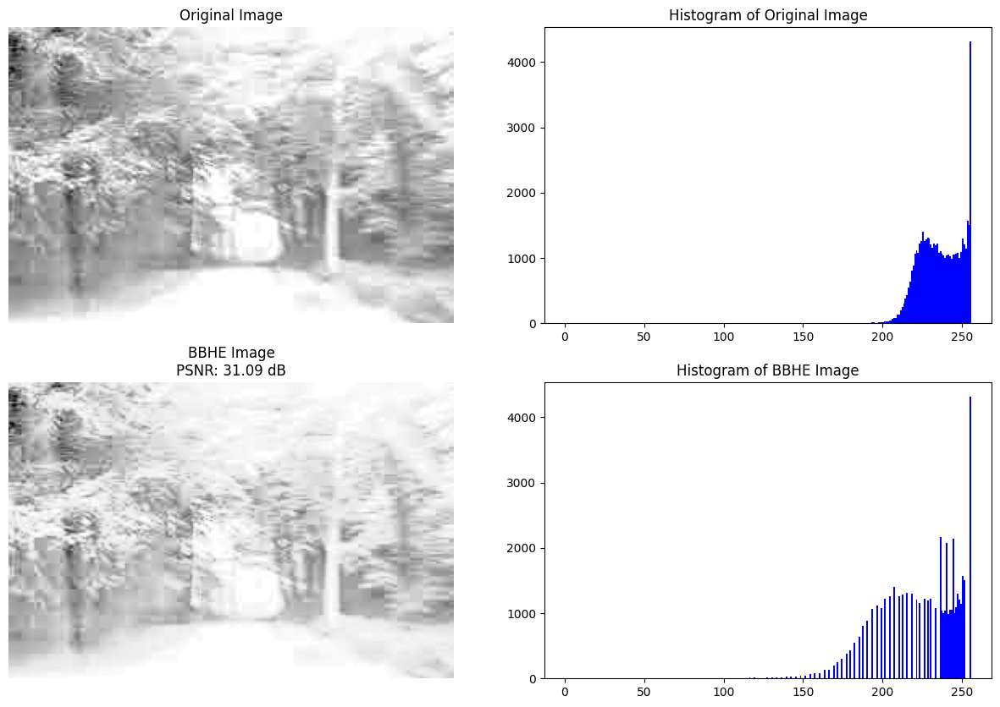

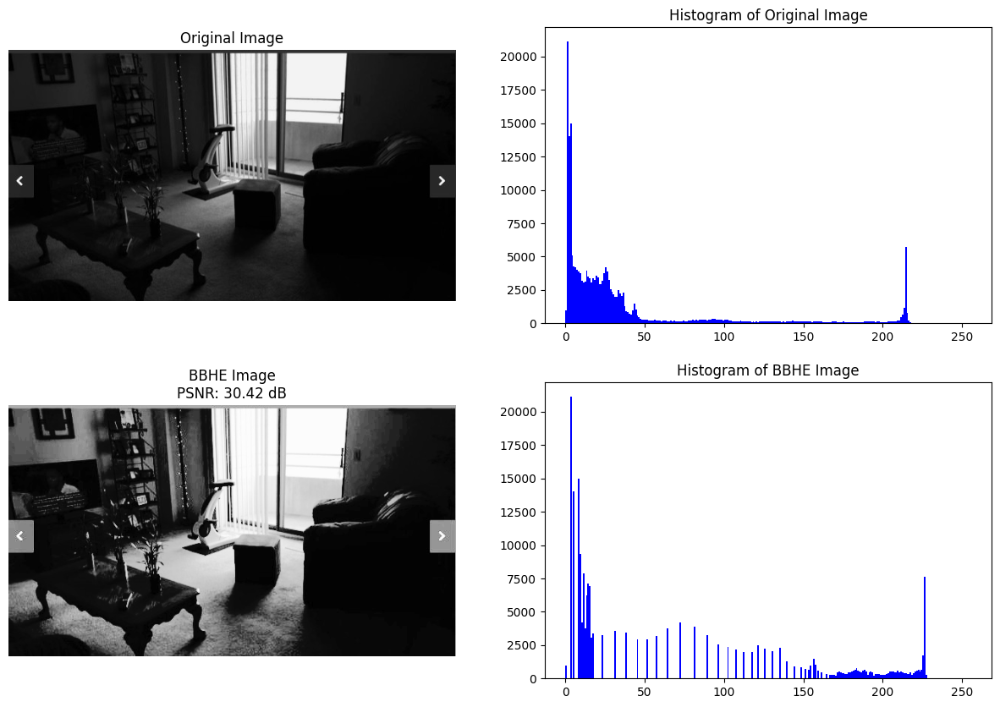

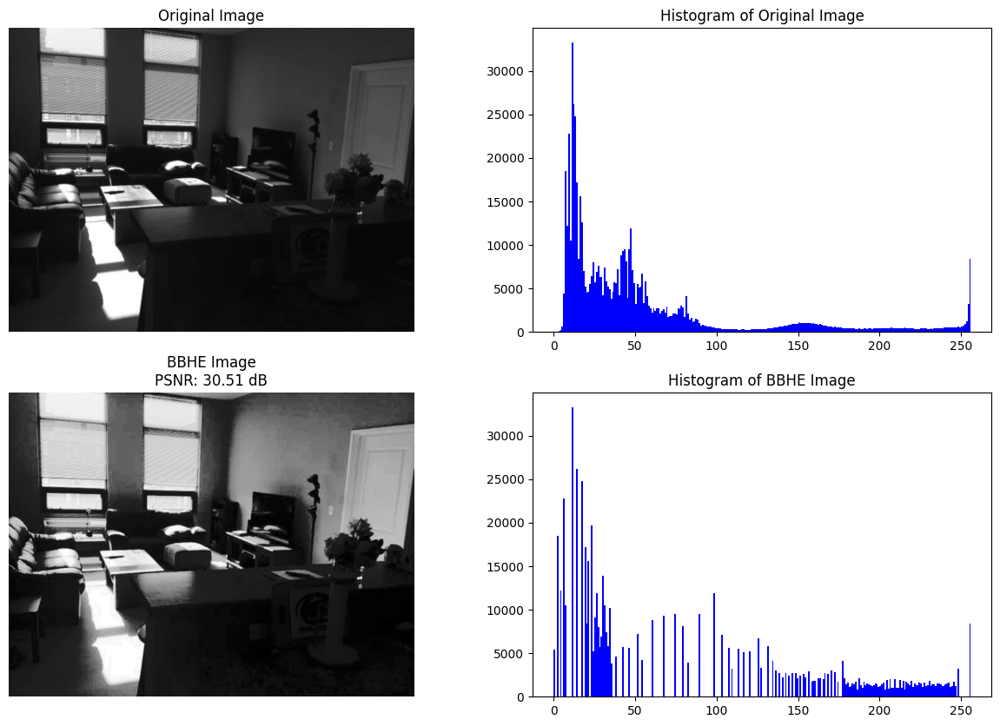

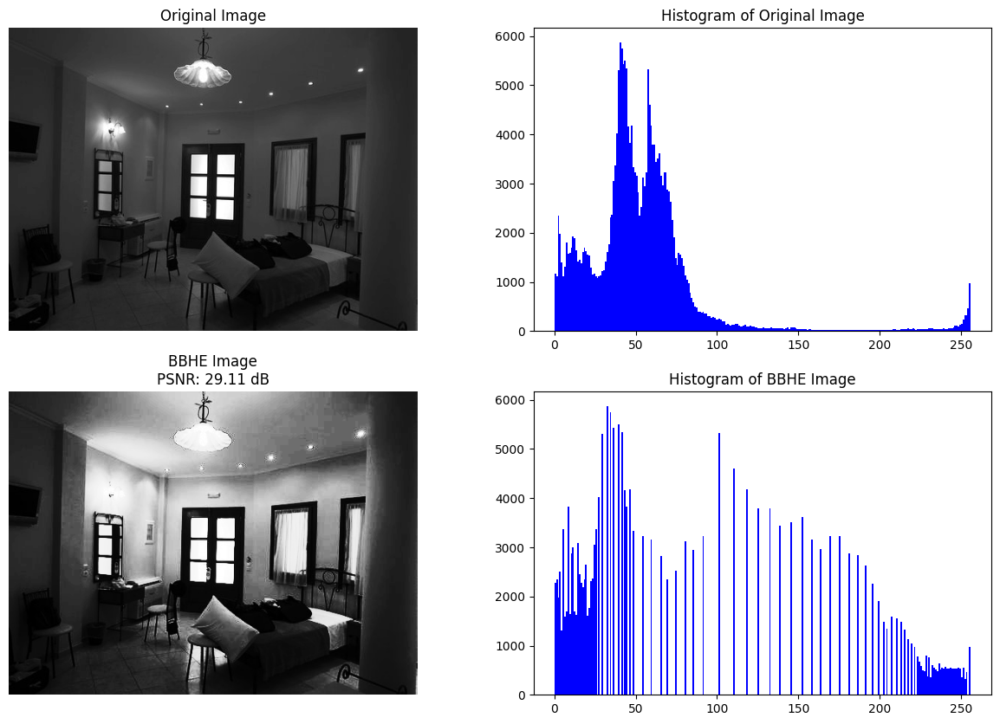

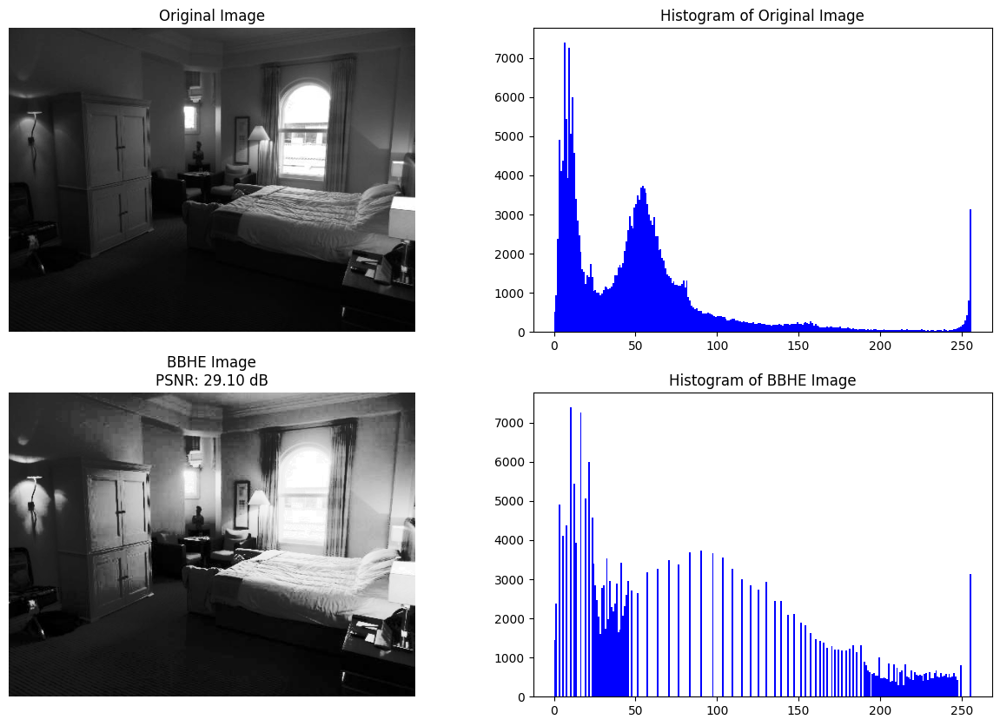

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def expand_hist(hist, target_length):
    """ Expand histogram to the target length using linear interpolation. """
    # Extract non-zero values
    hist_nonzero = hist[np.nonzero(hist)]

    if len(hist_nonzero) == 0:
        print(target_length)
        return np.zeros(target_length, dtype=np.uint64)

    # Indices for the non-zero histogram
    nonzero_indices = np.linspace(0, len(hist_nonzero) - 1, num=len(hist_nonzero))

    # Indices for the target length
    target_indices = np.linspace(0, len(hist_nonzero) - 1, num=target_length)

    # Perform linear interpolation
    expanded_hist = np.interp(target_indices, nonzero_indices, hist_nonzero)
    # print(expanded_hist)
    return expanded_hist.astype(np.uint64)


def bbhe(image):

    # cal histogram
    hist, _ = np.histogram(image.flatten(), 256, [0, 256])

    # cal average brightness
    mean_brightness = int(round(np.median(image)))

    # Initialize histograms for dark and bright regions
    lower_hist = np.zeros(256, dtype=np.uint64)
    upper_hist = np.zeros(256, dtype=np.uint64)

    # Compute histograms for dark and bright regions
    for pixel_value in image.flatten():
        if pixel_value <= mean_brightness:
            lower_hist[pixel_value] += 1
        else:
            upper_hist[pixel_value] += 1

    # print(lower_hist)
    # print(upper_hist)
    # Expand histograms to match the length of LUT
    lower_hist_expanded = expand_hist(lower_hist, mean_brightness + 1)
    upper_hist_expanded = expand_hist(upper_hist, 256 - mean_brightness - 1)


    # Calculate CDFs
    lower_cdf = np.cumsum(lower_hist_expanded) / np.cumsum(lower_hist_expanded)[-1]
    upper_cdf = np.cumsum(upper_hist_expanded) / np.cumsum(upper_hist_expanded)[-1]

    # Normalize CDFs
    C1n = np.uint8(mean_brightness * lower_cdf)
    C2n = np.uint8(mean_brightness + (255 - mean_brightness) * upper_cdf)

    # Create LUT with correct length
    lut = np.zeros(256, dtype=np.uint8)
    lut[:mean_brightness + 1] = C1n
    lut[mean_brightness + 1:] = C2n

    # # Visualization
    # plt.figure(figsize=(15, 5))

    # # Original histogram
    # plt.subplot(1, 3, 1)
    # plt.plot(hist, color='black')
    # plt.axvline(x=mean_brightness, color='r', linestyle='--')
    # plt.title('Original Histogram')
    # plt.xlabel('Pixel Value')
    # plt.ylabel('Frequency')

    # # CDFs
    # plt.subplot(1, 3, 2)
    # plt.plot(np.arange(mean_brightness + 1), lower_cdf, color='blue', label='Lower CDF')
    # plt.plot(np.arange(mean_brightness + 1, 256),upper_cdf, color='red', label='Upper CDF')
    # plt.title('CDFs')
    # plt.xlabel('Pixel Value')
    # plt.ylabel('CDF Value')
    # plt.legend()

    # # Mapping function
    # plt.subplot(1, 3, 3)
    # plt.plot(np.arange(256), lut, color='green')
    # plt.title('Mapping Function')
    # plt.xlabel('Input Pixel Value')
    # plt.ylabel('Output Pixel Value')

    # plt.tight_layout()
    # plt.show()

    # mapping
    return cv2.LUT(image, lut)


# plt.tight_layout()
# plt.show()

for i in range(1,9):
  mse_he=[]
  psnr_he=[]
  for j in range(1,5):
    image_path = f"images/sample0{i}.jpg"
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # BBHE
    bbhe_img = bbhe(img)

    # Cal PSNR
    mse_bbhe,psnr_bbhe = calculate_psnr(img, bbhe_img)


  print(f"sample0{i}.jpg mse:",np.mean(mse_he))
  print(f"sample0{i}.jpg psnr:",np.mean(psnr_he))
  # Show the result
  fig, axs = plt.subplots(2, 2, figsize=(15, 10))

  # Original Image and its Histogram
  axs[0, 0].imshow(img, cmap='gray')
  axs[0, 0].set_title('Original Image')
  axs[0, 0].axis('off')
  axs[0, 1].hist(img.ravel(), 256, [0, 256], color='b')
  axs[0, 1].set_title('Histogram of Original Image')

  # CLAHE Image and its Histogram
  axs[1, 0].imshow(bbhe_img, cmap='gray')
  axs[1, 0].set_title(f'BBHE Image\nPSNR: {psnr_bbhe:.2f} dB')
  axs[1, 0].axis('off')
  axs[1, 1].hist(bbhe_img.ravel(), 256, [0, 256], color='b')
  axs[1, 1].set_title('Histogram of BBHE Image')
  # bbhe_img = bbhe(img)
  # mse_he_i,psnr_he_i = calculate_psnr(img,bbhe_img)
  # mse_he.append(mse_he_i)
  # psnr_he.append(psnr_he_i)


sample01.jpg mse: 58.3270703125
sample01.jpg psnr: 30.472101978969818


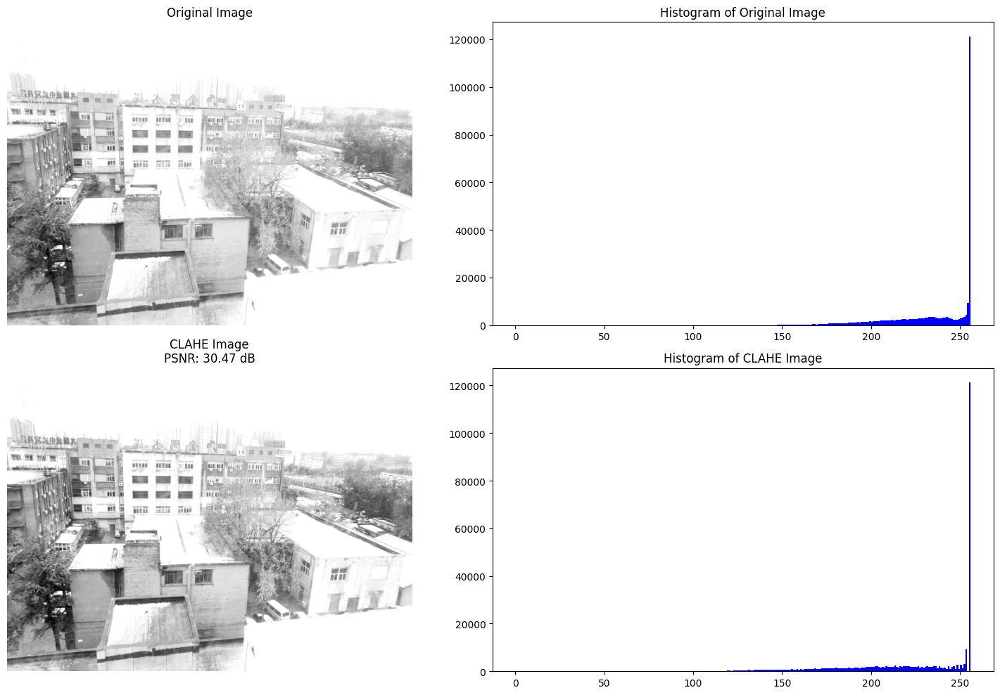

sample02.jpg mse: 68.08084225609998
sample02.jpg psnr: 29.800554409224908


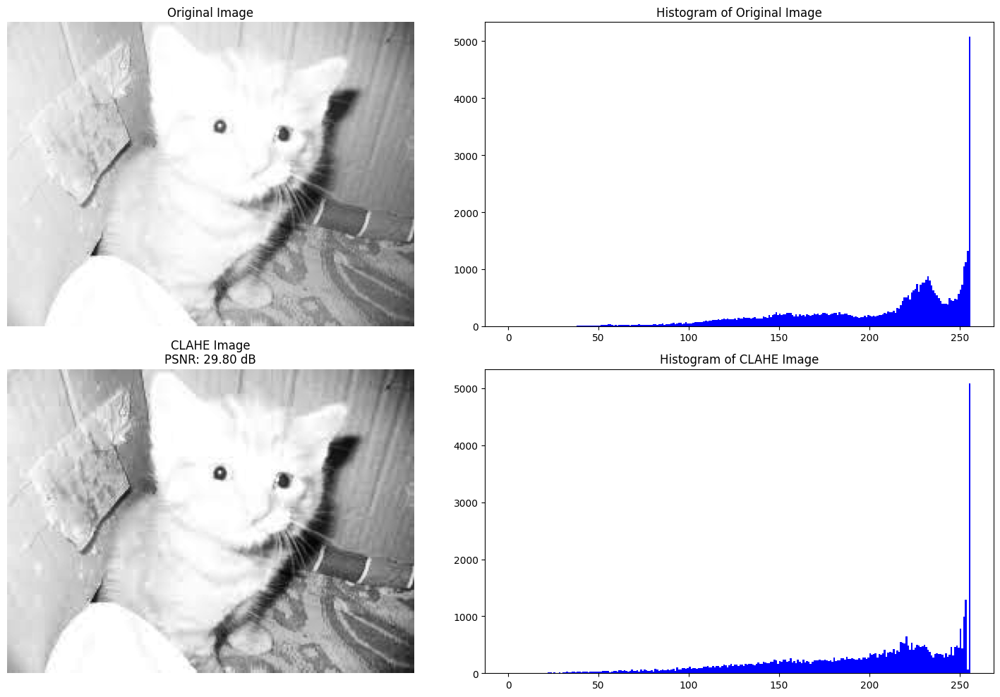

sample03.jpg mse: 74.27578314691716
sample03.jpg psnr: 29.42233121266102


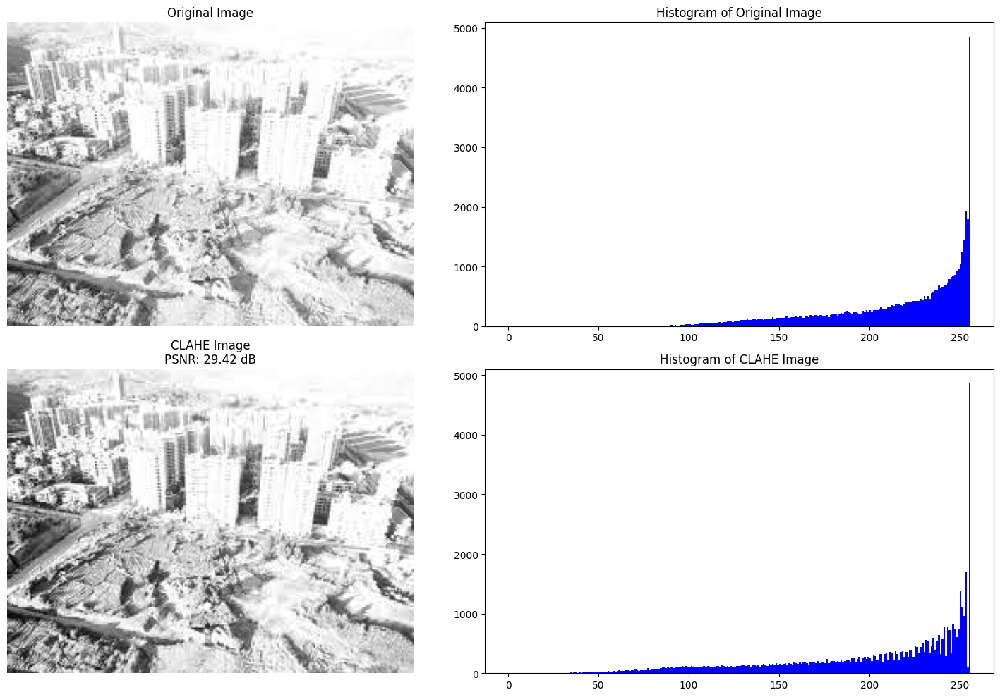

sample04.jpg mse: 84.65601589667163
sample04.jpg psnr: 28.85422535128283


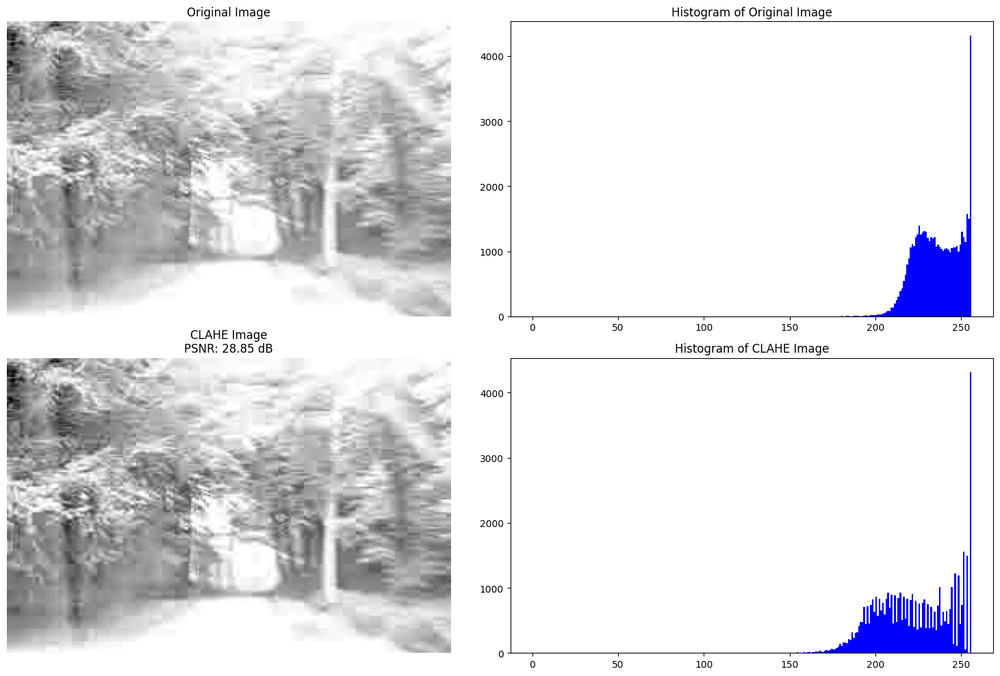

sample05.jpg mse: 82.17886251236399
sample05.jpg psnr: 28.98320235234616


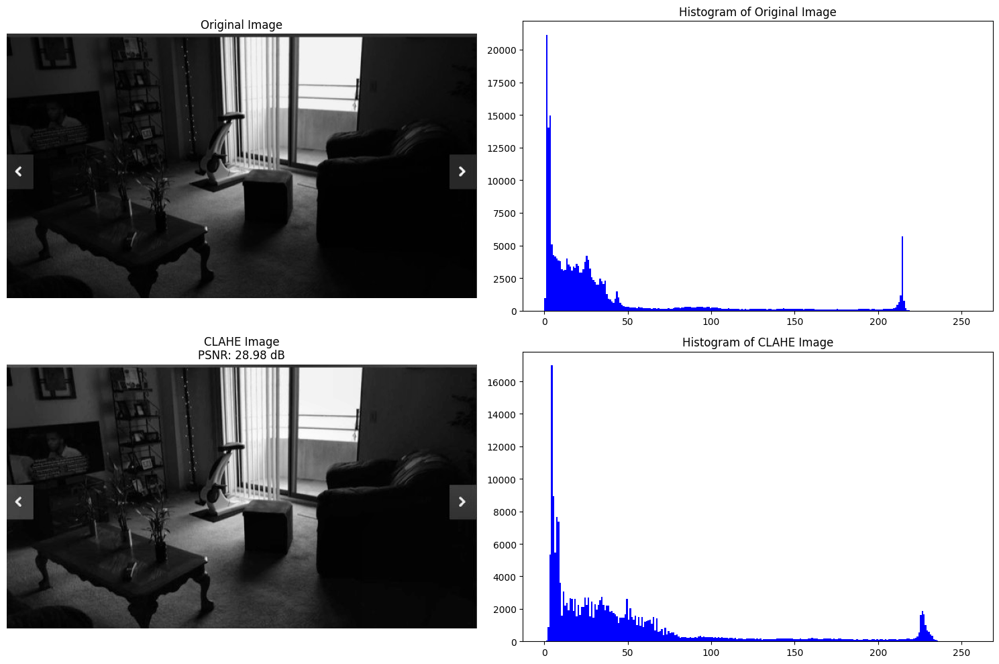

sample06.jpg mse: 64.22260550576803
sample06.jpg psnr: 30.053924399889723


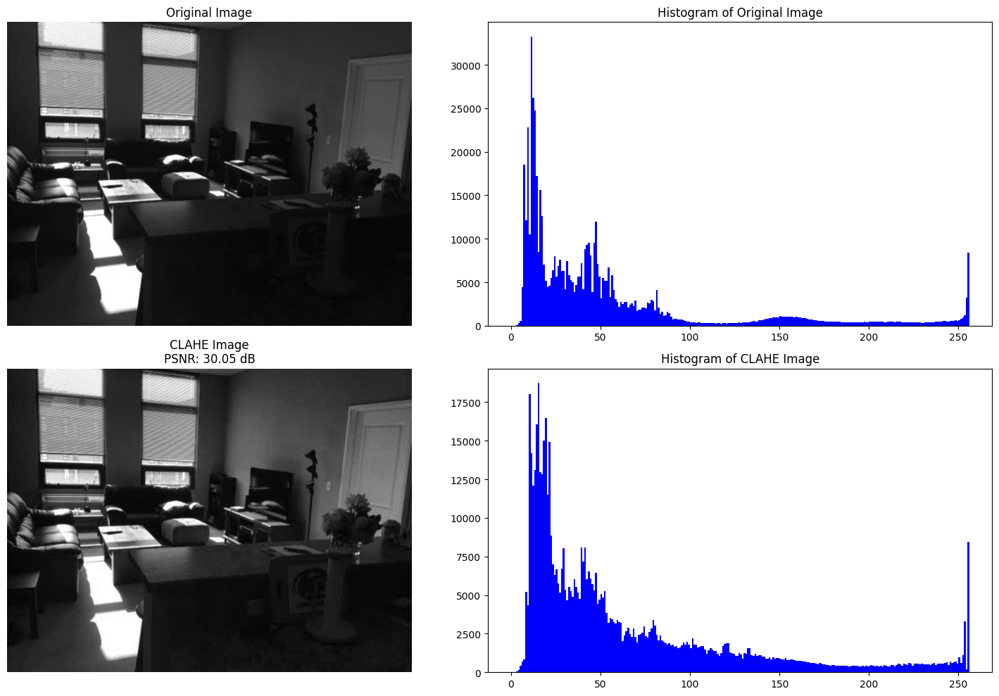

sample07.jpg mse: 90.57950980392157
sample07.jpg psnr: 28.560503948193595


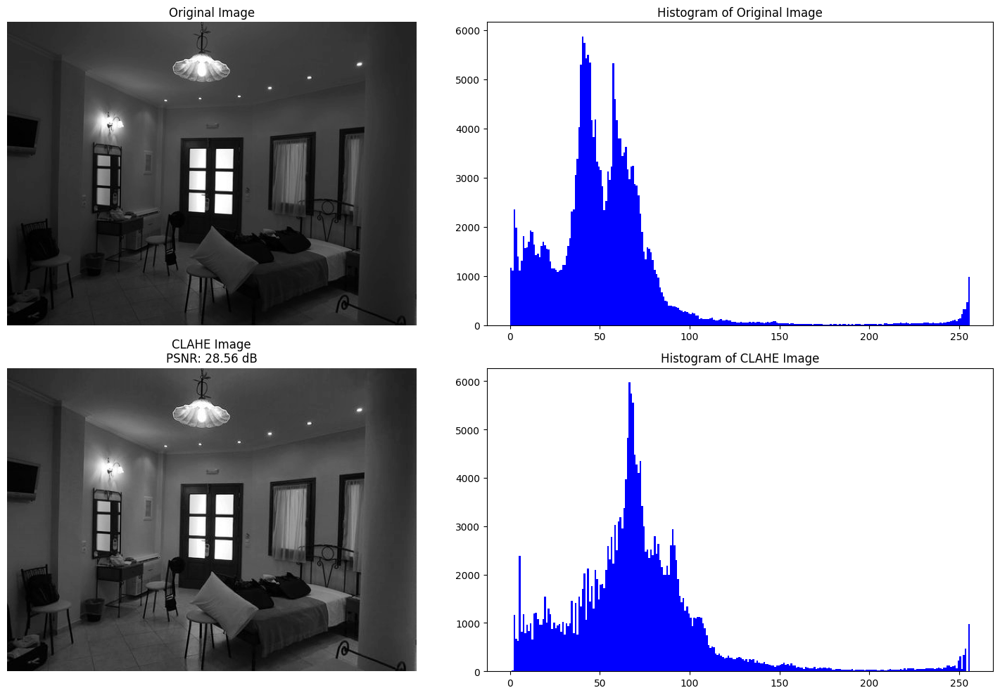

sample08.jpg mse: 83.5868799646955
sample08.jpg psnr: 28.909422461812348


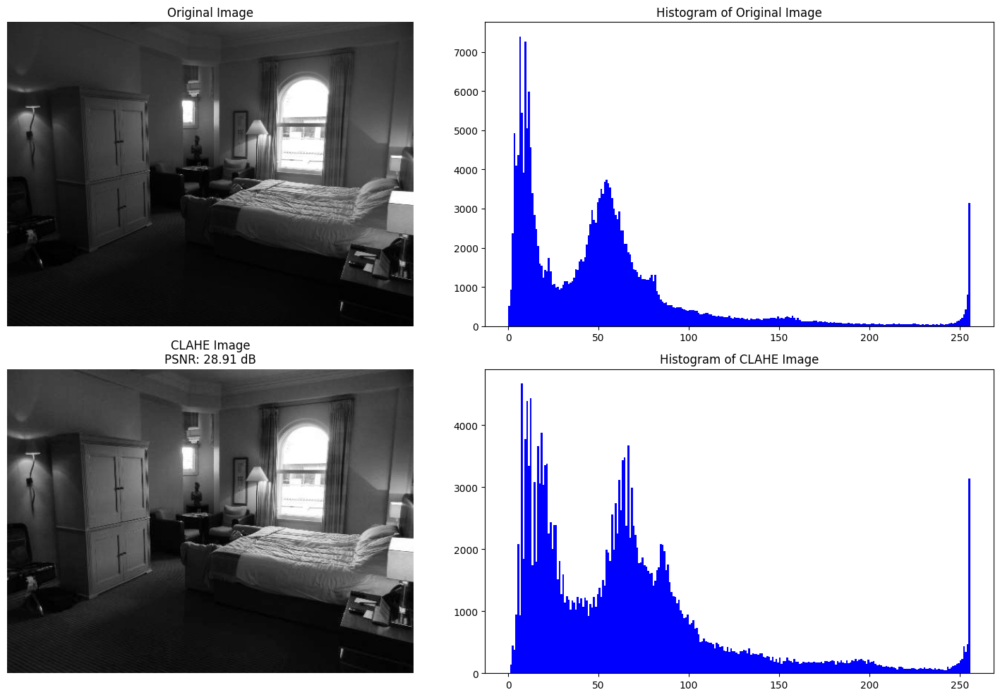

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def clahe(image, clip_limit, tile_grid_size):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

for i in range(1,9):
  mse_he=[]
  psnr_he=[]
  for j in range(1,5):
    image_path = f"images/sample0{i}.jpg"
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    clahe_img = clahe(img, clip_limit=1, tile_grid_size=(4, 4))


    mse_clahe,psnr_clahe = calculate_psnr(img,clahe_img)
    mse_he.append(mse_clahe)
    psnr_he.append(psnr_clahe)

  print(f"sample0{i}.jpg mse:",np.mean(mse_he))
  print(f"sample0{i}.jpg psnr:",np.mean(psnr_he))
  fig, axs = plt.subplots(2, 2, figsize=(15, 10))

  # Original Image and its Histogram
  axs[0, 0].imshow(img, cmap='gray')
  axs[0, 0].set_title('Original Image')
  axs[0, 0].axis('off')
  axs[0, 1].hist(img.ravel(), 256, [0, 256], color='b')
  axs[0, 1].set_title('Histogram of Original Image')

  # CLAHE Image and its Histogram
  axs[1, 0].imshow(clahe_img, cmap='gray')
  axs[1, 0].set_title(f'CLAHE Image\nPSNR: {psnr_clahe:.2f} dB')
  axs[1, 0].axis('off')
  axs[1, 1].hist(clahe_img.ravel(), 256, [0, 256], color='b')
  axs[1, 1].set_title('Histogram of CLAHE Image')

  plt.tight_layout()
  plt.show()




sample01.jpg mse: 68.27013997395834
sample01.jpg psnr: 29.78849567583314
sample02.jpg mse: 113.97615730605422
sample02.jpg psnr: 27.562663501752528
sample03.jpg mse: 72.77721609680373
sample03.jpg psnr: 29.510849221062927
sample04.jpg mse: 107.92572280178838
sample04.jpg psnr: 27.799553949662716
sample05.jpg mse: 106.8926706231454
sample05.jpg psnr: 27.84132433180651
sample06.jpg mse: 97.2523241034222
sample06.jpg psnr: 28.25180372122288
sample07.jpg mse: 98.7065285204991
sample07.jpg psnr: 28.18734482700186
sample08.jpg mse: 89.43488084730804
sample08.jpg psnr: 28.615734281452426


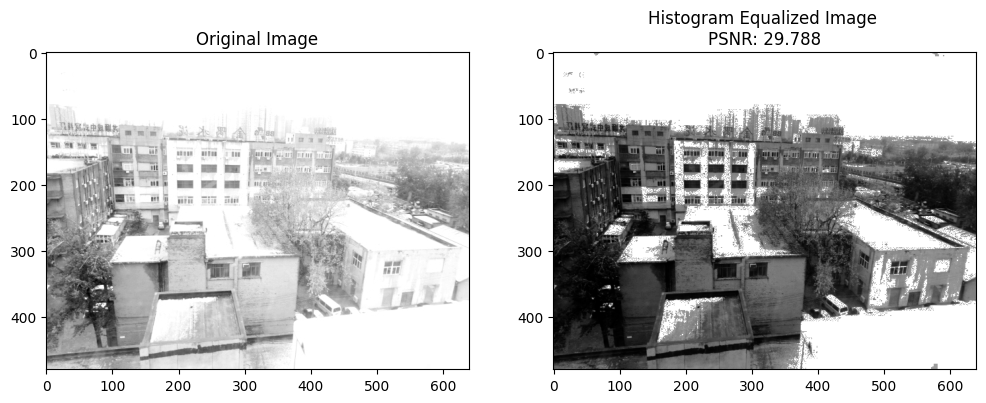

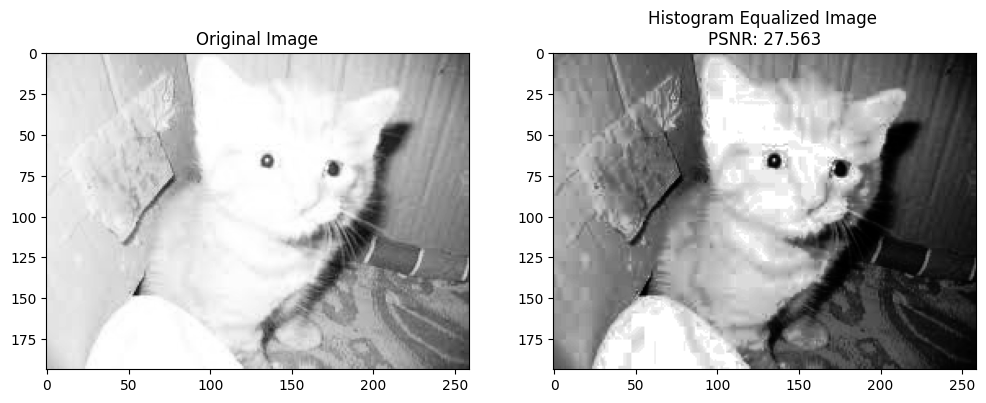

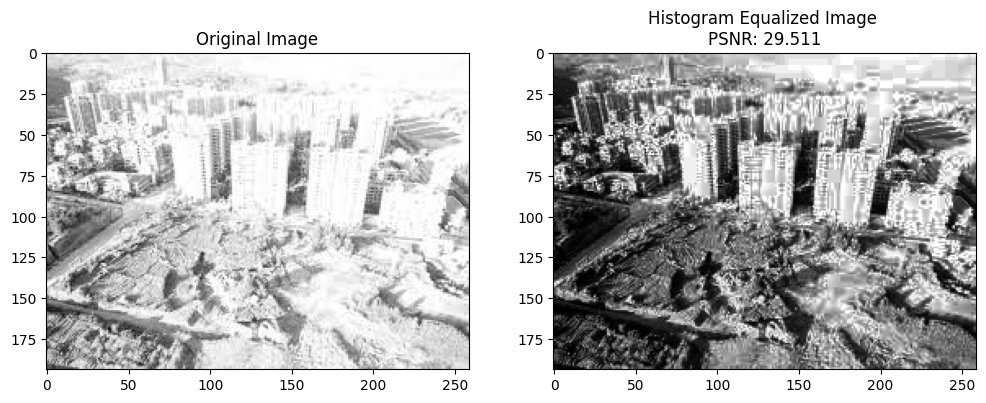

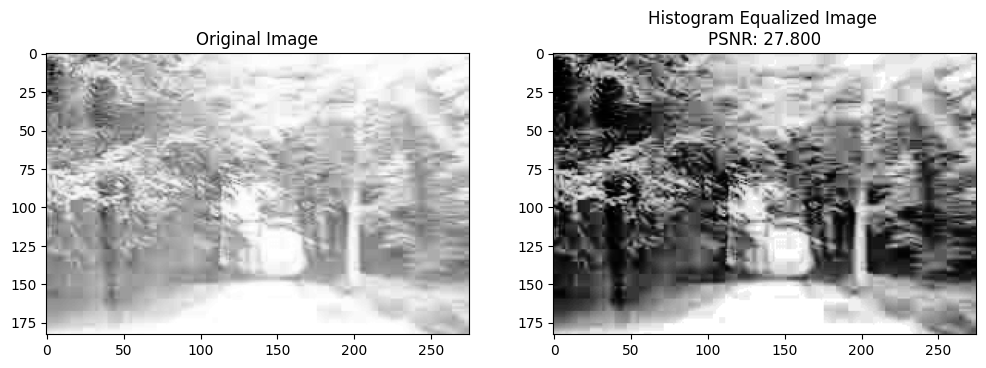

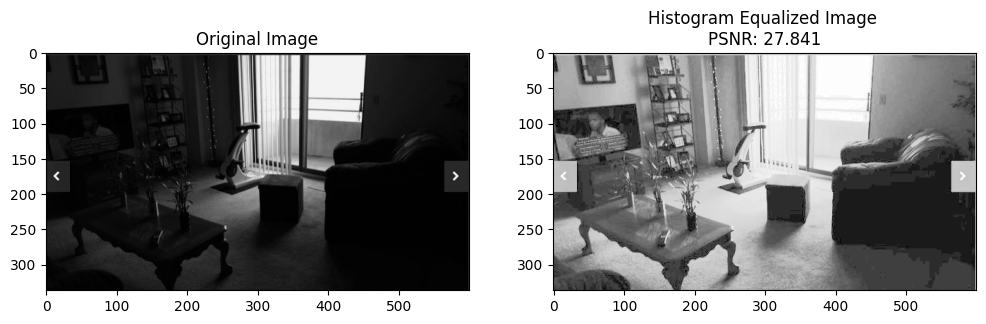

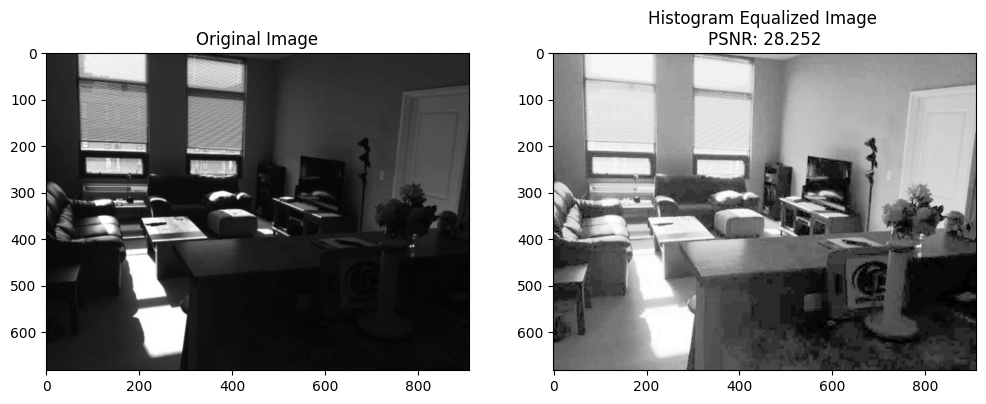

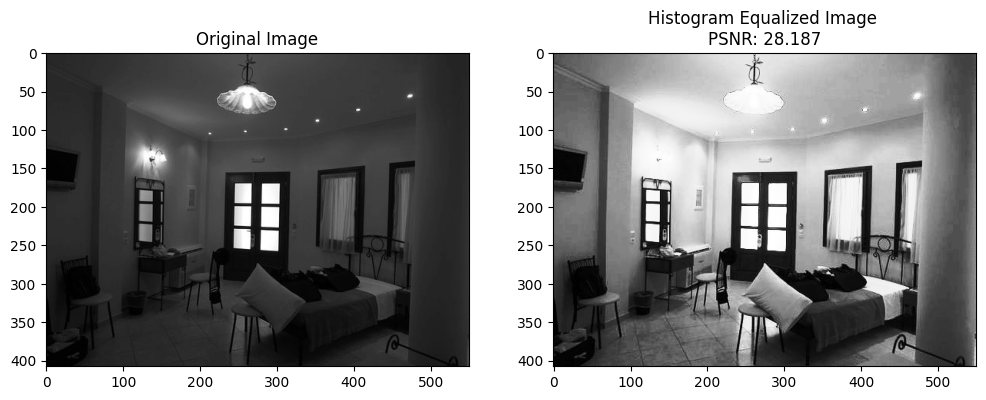

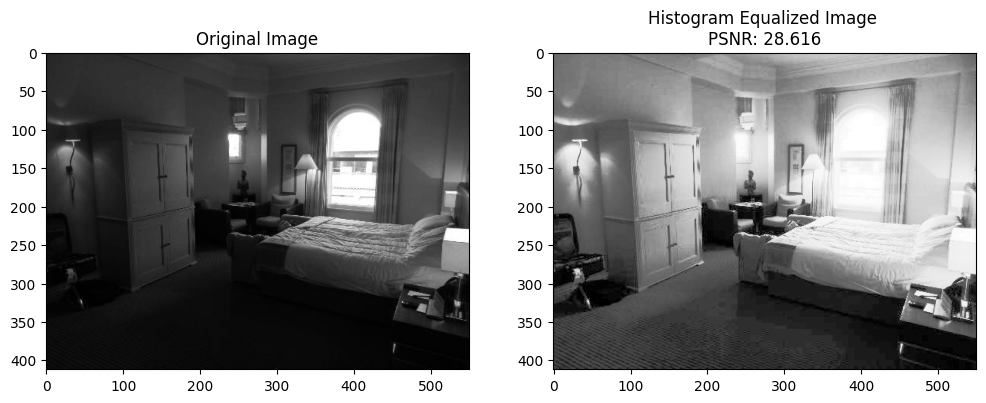

In [30]:
# Gery image for HE
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

image = Image.open('images/sample01.jpg').convert('L')
image = np.array(image)

#compute HE
def histogram_equalization(img):
    """
    Use HE to normalize the input image
    Args:
        img: input image
    """
    # compute hist
    hist, _ = np.histogram(img.flatten(), bins=256, range=[0, 256])

    cdf = hist.cumsum()

    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')


    he_img = cdf[img]

    return he_img
# use plt to visualize
# he_image = histogram_equalization(image)


# plt.figure(figsize=(12, 6))

# plt.subplot(1, 2, 1)
# plt.title('Original Image')
# plt.imshow(image, cmap='gray')

# plt.subplot(1, 2, 2)
# plt.title('Histogram Equalized Image \nPSNR: %.3f'%psnr_he_g)
# plt.imshow(he_image, cmap='gray')

plt.show()
for i in range(1,9):
  mse_he=[]
  psnr_he=[]
  for j in range(1,5):
    image_path = f"images/sample0{i}.jpg"
    image = Image.open(image_path).convert('L')
    image = np.array(image)
    he_image = histogram_equalization(image)
    mse_he_g,psnr_he_g = calculate_psnr(image,he_image)
    mse_he.append(mse_he_g)
    psnr_he.append(psnr_he_g)
  print(f"sample0{i}.jpg mse:",np.mean(mse_he))
  print(f"sample0{i}.jpg psnr:",np.mean(psnr_he))
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.title('Original Image')
  plt.imshow(image, cmap='gray')

  plt.subplot(1, 2, 2)
  plt.title('Histogram Equalized Image \nPSNR: %.3f'%psnr_he_g)
  plt.imshow(he_image, cmap='gray')


sample01.jpg mse: 19.320363498263887
sample01.jpg psnr: 35.2706506778403


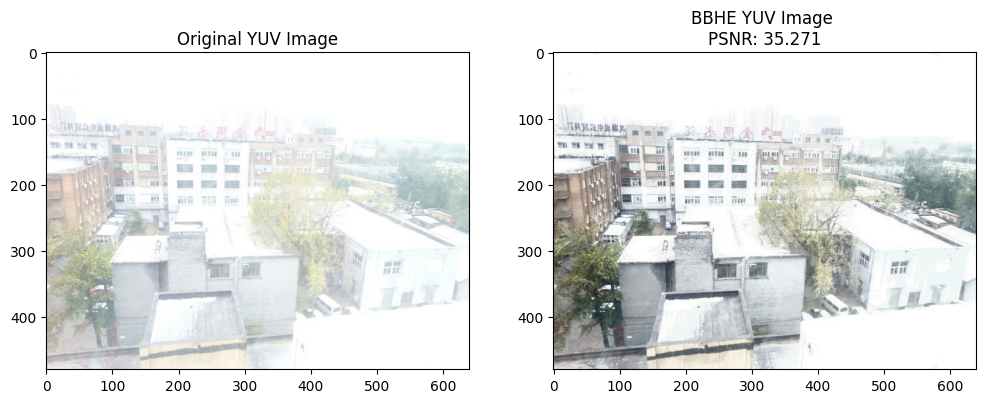

sample02.jpg mse: 21.676723851981585
sample02.jpg psnr: 34.77086715866898


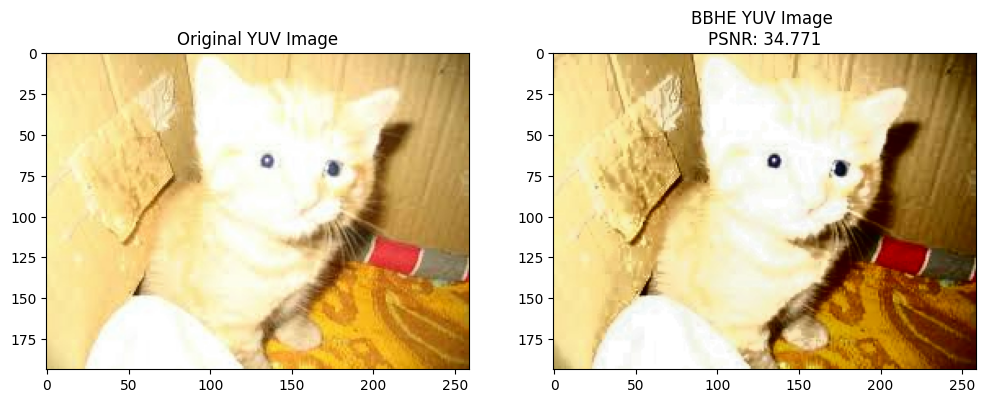

sample03.jpg mse: 21.954152237657393
sample03.jpg psnr: 34.71563689439615


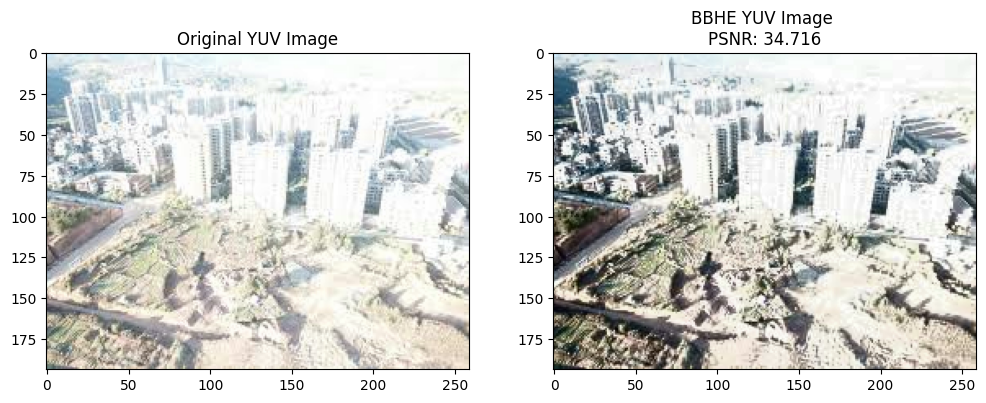

sample04.jpg mse: 17.801556549097533
sample04.jpg psnr: 35.62622382652914


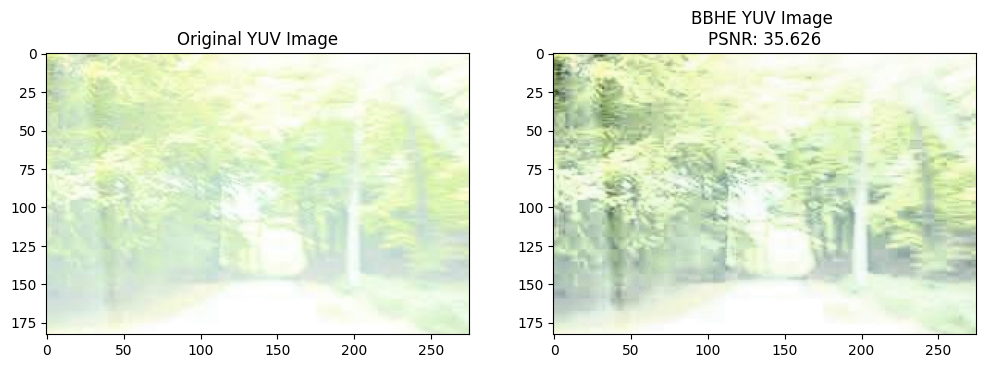

sample05.jpg mse: 21.43338608638312
sample05.jpg psnr: 34.81989573752142


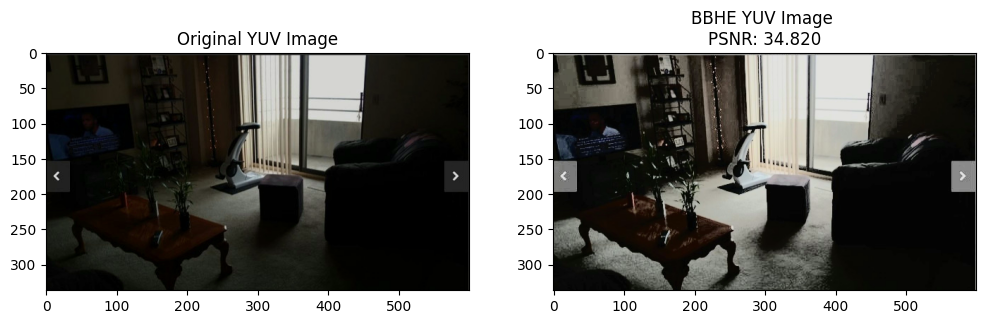

sample06.jpg mse: 17.706110726754943
sample06.jpg psnr: 35.64957185076236


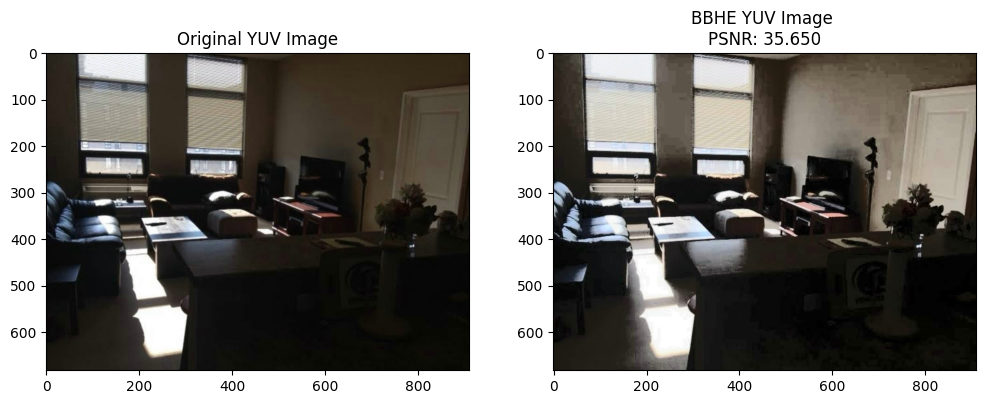

sample07.jpg mse: 23.65795157456922
sample07.jpg psnr: 34.39103222366953


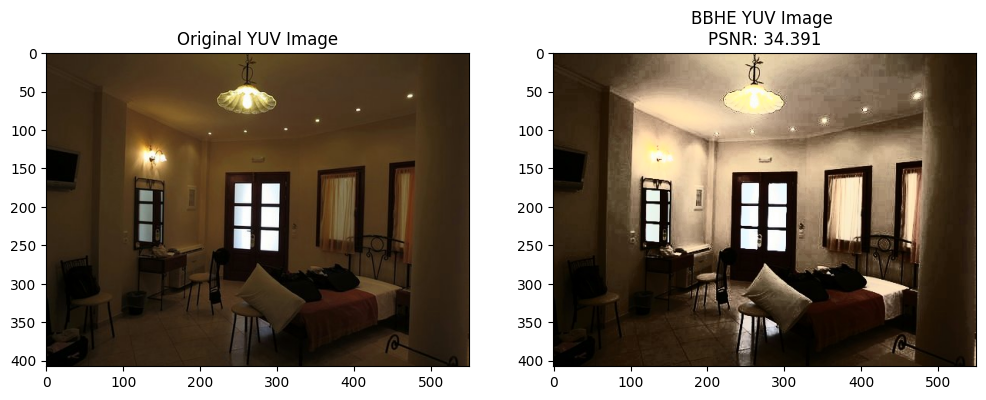

sample08.jpg mse: 25.73842600764931
sample08.jpg psnr: 34.02498376073184


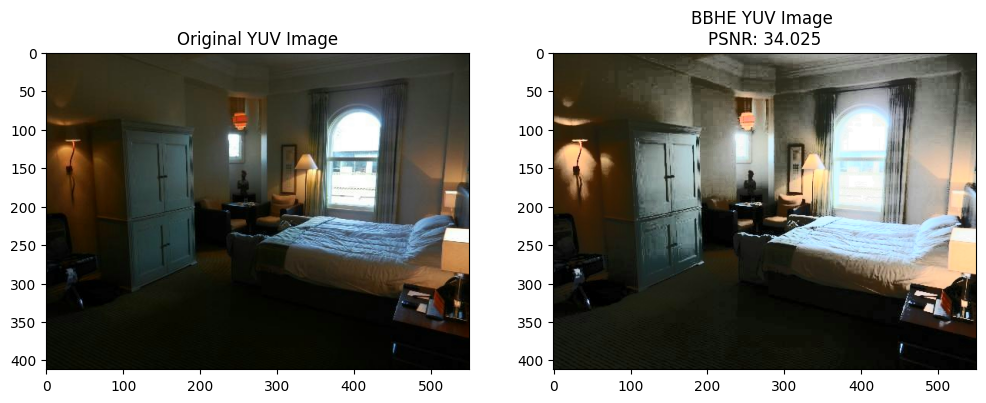

In [32]:
# yuv bbhe & clahe
import numpy as np

# YUV_img = np.load('sample01_yuv.npy')

# Y = YUV_img[...,0]
# Y_equalized = bbhe(Y)
# YUV_img[...,0] = Y_equalized

# YUV_img_original = np.load('sample01_yuv.npy')

#mse_bbhe_yuv,psnr_bbhe_yuv = calculate_psnr(YUV_img_original, YUV_img)
for i in range(1,9):
  mse_he=[]
  psnr_he=[]
  for j in range(1,5):
    image_path = f"sample0{i}_yuv.npy"
    YUV_img = np.load(image_path)
    Y = YUV_img[...,0]
    Y_equalized = bbhe(Y)
    YUV_img[...,0] = Y_equalized
    YUV_img_original = np.load(image_path)
    mse_bbhe_yuv,psnr_bbhe_yuv = calculate_psnr(YUV_img_original, YUV_img)
    mse_he.append(mse_bbhe_yuv)
    psnr_he.append(psnr_bbhe_yuv)
  print(f"sample0{i}.jpg mse:",np.mean(mse_he))
  print(f"sample0{i}.jpg psnr:",np.mean(psnr_he))
  # convert back to RGB for visualization
  rgb_equalized =  yuv_to_rgb(YUV_img)
  rgb_original = yuv_to_rgb(YUV_img_original)

  # visualization
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.title('Original YUV Image')
  plt.imshow(rgb_original)

  plt.subplot(1, 2, 2)
  plt.title('BBHE YUV Image \nPSNR: %.3f'%psnr_bbhe_yuv)
  plt.imshow(rgb_equalized)

  plt.show()

sample01.jpg mse: 20.66061848958333
sample01.jpg psnr: 34.979370425907625


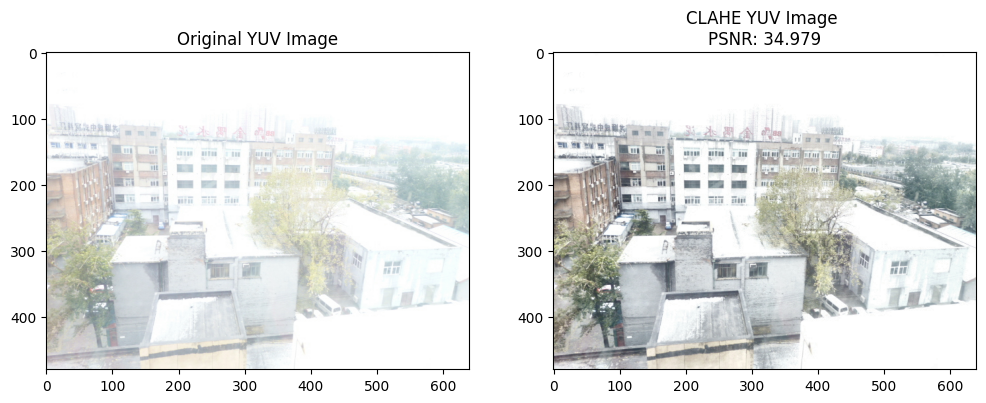

sample02.jpg mse: 26.530178189972005
sample02.jpg psnr: 33.89340193936403


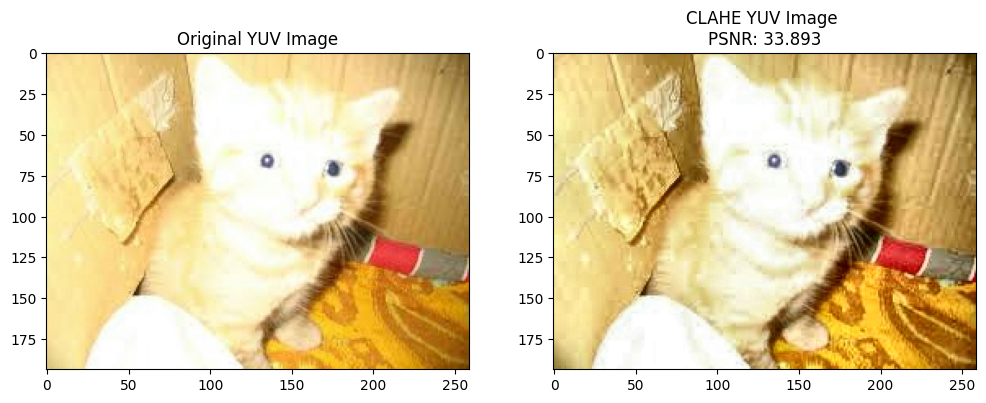

sample03.jpg mse: 28.025149597314545
sample03.jpg psnr: 33.65532421345242


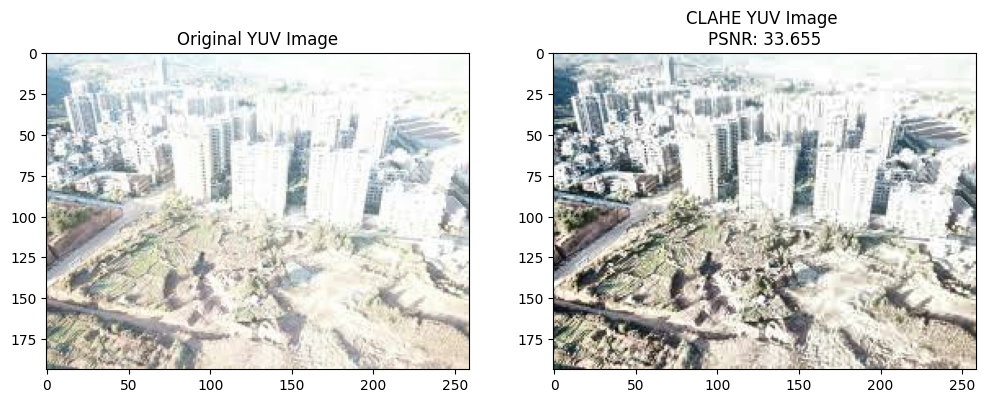

sample04.jpg mse: 30.347342275211126
sample04.jpg psnr: 33.309596979360705


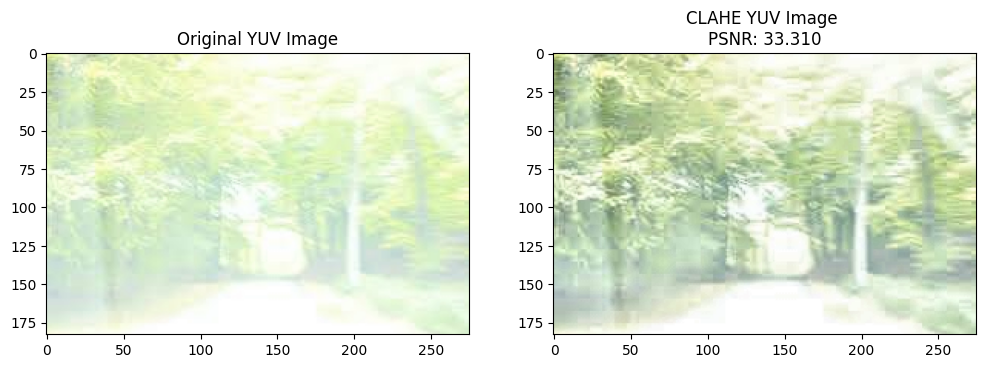

sample05.jpg mse: 28.767538740520937
sample05.jpg psnr: 33.5417765424819


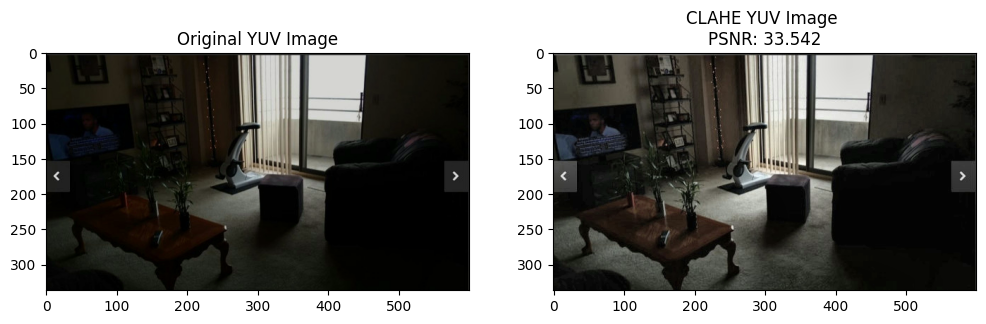

sample06.jpg mse: 27.738314589266274
sample06.jpg psnr: 33.700002915429884


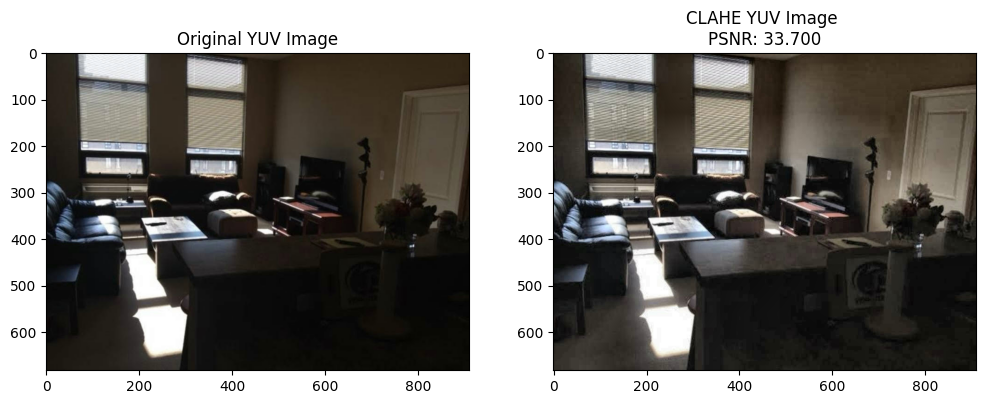

sample07.jpg mse: 31.904187462863934
sample07.jpg psnr: 33.09232672398078


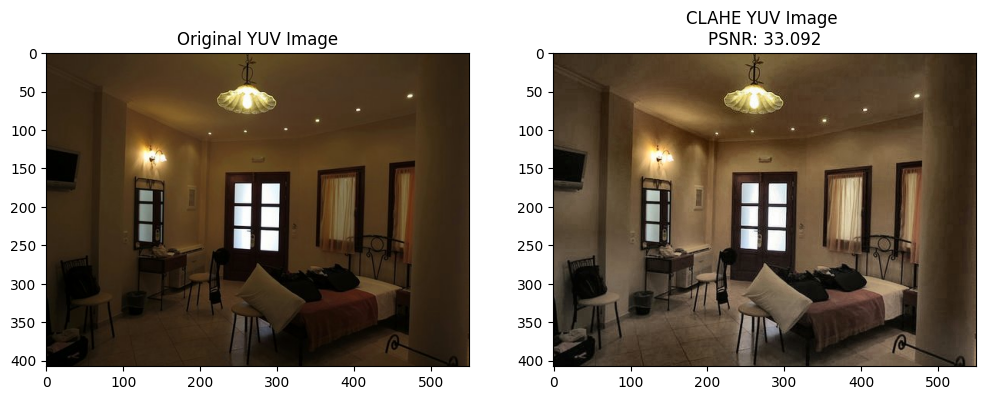

sample08.jpg mse: 33.780297146219475
sample08.jpg psnr: 32.844168953725344


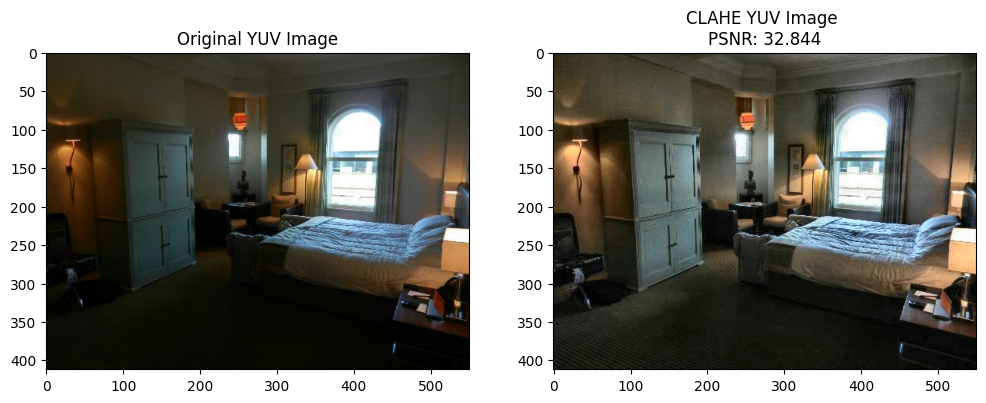

In [35]:
# yuv clahe
import numpy as np

# YUV_img = np.load('sample01_yuv.npy')

# Y = YUV_img[...,0]
# Y_equalized = clahe(Y, clip_limit=2.0, tile_grid_size=(8, 8))
# YUV_img[...,0] = Y_equalized

# YUV_img_original = np.load('sample01_yuv.npy')

for i in range(1,9):
  mse_he=[]
  psnr_he=[]
  for j in range(1,5):
    image_path = f"sample0{i}_yuv.npy"
    YUV_img = np.load(image_path)
    Y = YUV_img[...,0]
    Y_equalized = clahe(Y, clip_limit=2.0, tile_grid_size=(8, 8))
    YUV_img[...,0] = Y_equalized
    YUV_img_original = np.load(image_path)
    mse_clahe_yuv,psnr_clahe_yuv = calculate_psnr(YUV_img_original, YUV_img)
    mse_he.append(mse_clahe_yuv)
    psnr_he.append(psnr_clahe_yuv)
  print(f"sample0{i}.jpg mse:",np.mean(mse_he))
  print(f"sample0{i}.jpg psnr:",np.mean(psnr_he))
  # convert back to RGB for visualization
  rgb_equalized =  yuv_to_rgb(YUV_img)
  rgb_original = yuv_to_rgb(YUV_img_original)

  # visualization
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.title('Original YUV Image')
  plt.imshow(rgb_original)

  plt.subplot(1, 2, 2)
  plt.title('CLAHE YUV Image \nPSNR: %.3f'%psnr_clahe_yuv)
  plt.imshow(rgb_equalized)

  plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from tabulate import tabulate

def create_table():
    """Create the table with PSNR and MSE values"""
    samples = [f'sample0{i}' for i in range(1, 9)]
    methods = ['HE', 'BBHE', 'CLAHE']
    color_spaces = ['Gray', 'YCbCr']

    data = []
    for color_space in color_spaces:
        for method in methods:
            row = []
            for sample in samples:
                image_path = f"images/{sample}.jpg"
                mse, psnr = average_runs(image_path, method, color_space)
                row.append(f"{psnr:.2f}\n({mse:.2f})")
            data.append(row)

    index = pd.MultiIndex.from_product([color_spaces, methods], names=['Color Space', 'Method'])
    df = pd.DataFrame(data, index=index, columns=samples)
    return df

def visualize_table(df):
    """Visualize the table as a LaTeX three-line table"""
    latex_table = df.to_latex(
        escape=False,
        column_format='|c' + '|' + 'c' * len(df.columns),
        header=True,
        index=True,
        caption='PSNR and MSE values for different methods and color spaces',
        label='tab:psnr_mse',
        position='h',
        multicolumn_format='c'
    )

    # Add three-line table format
    latex_table = latex_table.replace('\\toprule', '\\hline')
    latex_table = latex_table.replace('\\midrule', '\\hline')
    latex_table = latex_table.replace('\\bottomrule', '\\hline')

    print(latex_table)


# Create and visualize the table
df = create_table()
visualize_table(df)

\begin{table}[h]
\caption{PSNR and MSE values for different methods and color spaces}
\label{tab:psnr_mse}
\begin{tabular}{|c|cccccccc}
\hline
 &  & sample01 & sample02 & sample03 & sample04 & sample05 & sample06 & sample07 & sample08 \\
Color Space & Method &  &  &  &  &  &  &  &  \\
\hline
\multirow[t]{3}{*}{Gray} & HE & 54.34
(0.33) & 33.00
(0.53) & 51.06
(0.57) & 34.81
(0.42) & 37.59
(0.62) & 44.69
(0.55) & 66.28
(0.64) & 32.66
(0.50) \\
 & BBHE & 45.38
(0.55) & 56.31
(0.41) & 44.45
(0.38) & 40.51
(0.40) & 45.43
(0.60) & 75.03
(0.53) & 43.37
(0.48) & 54.33
(0.44) \\
 & CLAHE & 58.56
(0.44) & 43.25
(0.48) & 59.68
(0.45) & 46.11
(0.53) & 63.40
(0.45) & 42.94
(0.45) & 52.96
(0.49) & 65.90
(0.48) \\
\cline{1-10}
\multirow[t]{3}{*}{YCbCr} & HE & 42.85
(0.40) & 50.19
(0.43) & 43.26
(0.54) & 50.20
(0.65) & 40.77
(0.57) & 41.95
(0.55) & 49.69
(0.55) & 52.02
(0.55) \\
 & BBHE & 48.35
(0.49) & 63.82
(0.47) & 46.50
(0.43) & 44.43
(0.63) & 59.82
(0.55) & 60.97
(0.38) & 52.46
(0.47) & 45.94
(0.

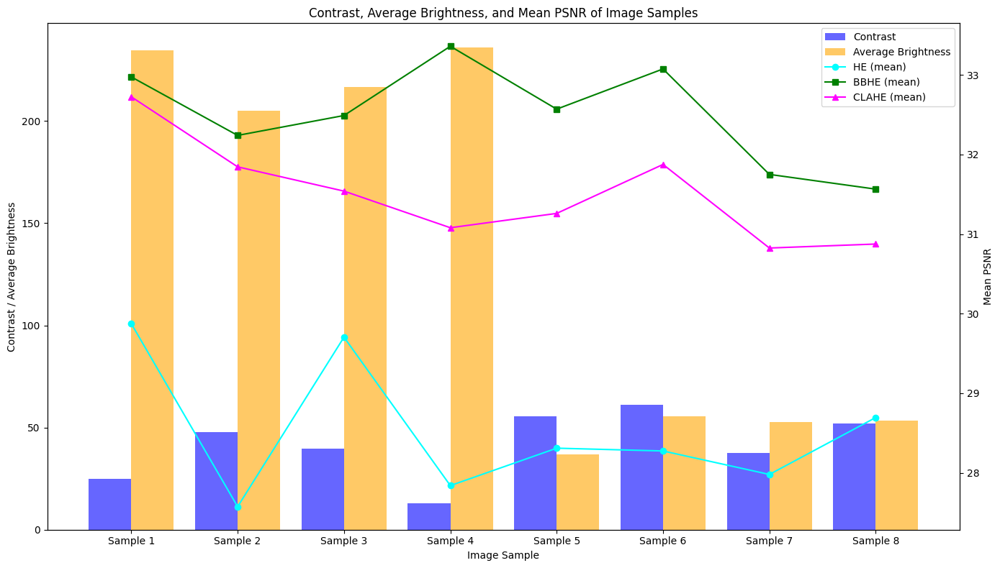

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_image_metrics(image_path):
    # Read the image
    image = cv2.imread(image_path)
    # Convert to RGB format
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert to grayscale
    gray_image = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

    # Calculate mean brightness
    mean_brightness = np.mean(gray_image)
    # Calculate contrast (standard deviation)
    contrast = gray_image.std()

    return contrast, mean_brightness

def plot_combined_metrics(image_paths, psnr_data):
    contrast_list = []
    brightness_list = []

    for path in image_paths:
        contrast, brightness = calculate_image_metrics(path)
        contrast_list.append(contrast)
        brightness_list.append(brightness)

    # Calculate the mean PSNR for each algorithm (Gray and YCbCr)
    algorithms = list(psnr_data.keys())
    psnr_means = {algo: np.mean([psnr_data[algo]['Gray'], psnr_data[algo]['YCbCr']], axis=0)
                  for algo in algorithms}

    # Create figure and two subplots
    fig, ax1 = plt.subplots(figsize=(14, 8))

    # Plot contrast as a bar chart
    x_positions = np.arange(len(image_paths))
    ax1.bar(x_positions - 0.2, contrast_list, width=0.4, color='blue', alpha=0.6, label='Contrast')
    ax1.bar(x_positions + 0.2, brightness_list, width=0.4, color='orange', alpha=0.6, label='Average Brightness')
    ax1.set_xlabel('Image Sample')
    ax1.set_ylabel('Contrast / Average Brightness')
    ax1.tick_params(axis='y')
    ax1.set_xticks(x_positions)
    ax1.set_xticklabels([f'Sample {i+1}' for i in range(len(image_paths))])

    # Create a second y-axis
    ax2 = ax1.twinx()

    # Plot mean PSNR values as a line plot
    plot_styles = {
        'HE': {'color': 'cyan', 'marker': 'o'},
        'BBHE': {'color': 'green', 'marker': 's'},
        'CLAHE': {'color': 'magenta', 'marker': '^'}
    }

    for algo in algorithms:
        ax2.plot(x_positions, psnr_means[algo],
                 color=plot_styles[algo]['color'], marker=plot_styles[algo]['marker'], linestyle='-',
                 label=f'{algo} (mean)')

    ax2.set_ylabel('Mean PSNR')
    ax2.tick_params(axis='y')

    # Add legends
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines1 + lines2, labels1 + labels2, loc='best')

    plt.title('Contrast, Average Brightness, and Mean PSNR of Image Samples')
    plt.tight_layout()
    plt.show()

# List of image paths
image_paths = [f'images/sample0{i}.jpg' for i in range(1, 9)]

# PSNR data
psnr_data = {
    'HE': {
        'Gray': [29.79, 27.56, 29.51, 27.79, 27.84, 28.25, 28.19, 28.61],
        'YCbCr': [29.96, 27.59, 29.9, 27.89, 28.78, 28.3, 27.77, 28.78]
    },
    'BBHE': {
        'Gray': [30.68, 29.71, 30.27, 31.09, 30.32, 30.51, 29.11, 29.10],
        'YCbCr': [35.27, 34.77, 34.71, 35.63, 34.82, 35.64, 34.39, 34.03]
    },
    'CLAHE': {
        'Gray': [30.47, 29.80, 29.42, 28.85, 28.98, 30.05, 28.56, 28.91],
        'YCbCr': [34.98, 33.89, 33.66, 33.31, 33.54, 33.70, 33.09, 32.84]
    }
}

plot_combined_metrics(image_paths, psnr_data)
